In [1]:
!pip install ultralytics roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 21.3 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.6/94.6 kB 8.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 38.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 55.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 99.5 MB/s eta 0:00:00:00:01
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.12.0.88
    Uninstalling opencv-python-headless-4.12.0.88:
      Successfully uninstalled opencv-python-headless-4.12.0.88
  Attempting uninstall: idna
    Found existing installation: idna 3.11
    Uninstalling idna-3.11:
      Successfully uninstalled idna-3.11
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of 

In [2]:
import torch
from roboflow import Roboflow
import os
import shutil
import yaml
import glob
from ultralytics import YOLO

print(torch.cuda.is_available())
print(torch.cuda.get_device_name(0))

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
True
Tesla T4


In [3]:
rf = Roboflow(api_key="qD3iNzdjJ3CCYP797XJ9")
project = rf.workspace("dsjourney").project("empty-spaces-detection-in-shelf-data")
dataset = project.version(4).download("yolov8")
project2 = rf.workspace("crosswalk-cfzzv").project("empty-space-detection-mart-shelf")
dataset2 = project2.version(1).download("yolov8")
# Dataset 3: Supermarket Empty Shelf Detector (497 images, class: "100- O-O-S")
project3 = rf.workspace("fyp-ormnr").project("supermarket-empty-shelf-detector")
dataset3 = project3.version(1).download("yolov8")

# Dataset 4: On Shelf Stock Availability (495 images, class: "Gaps")
project4 = rf.workspace("fyp-ormnr").project("on-shelf-stock-availability-ox04t")
dataset4 = project4.version(1).download("yolov8")

# Dataset 5: Empty Spaces in Supermarket (1,444 images - this is the big one)
project5 = rf.workspace("final-project-object-detection-for-instore-inventory-management").project("empty-spaces-in-a-supermarket-hanger-1upsp")
dataset5 = project5.version(1).download("yolov8")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Empty-Spaces-Detection-in-Shelf-Data-4 in yolov8:: 100%|██████████| 1232/1232 [00:00<00:00, 6481.48it/s]


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to empty-space-detection-mart-shelf-1 in yolov8:: 100%|██████████| 1608/1608 [00:00<00:00, 6248.83it/s]

loading Roboflow workspace...


loading Roboflow project...



Extracting Dataset Version Zip to Supermarket-Empty-Shelf-Detector--1 in yolov8:: 100%|██████████| 1006/1006 [00:00<00:00, 6644.77it/s]

loading Roboflow workspace...


loading Roboflow project...



Extracting Dataset Version Zip to On-Shelf-Stock-Availability--1 in yolov8:: 100%|██████████| 1002/1002 [00:00<00:00, 6633.27it/s]

loading Roboflow workspace...


loading Roboflow project...



Extracting Dataset Version Zip to Empty-spaces-in-a-supermarket-hanger-1 in yolov8:: 100%|██████████| 388/388 [00:00<00:00, 5896.51it/s]


In [4]:
# ============================================================
# STEP 1: Combine all datasets into one unified dataset
# ============================================================

combined_root = "combined_dataset"
for split in ["train", "valid", "test"]:
    os.makedirs(f"{combined_root}/{split}/images", exist_ok=True)
    os.makedirs(f"{combined_root}/{split}/labels", exist_ok=True)

# Map all dataset paths - adjust these to match your actual download paths
datasets = [
    dataset.location,
    dataset2.location,
    dataset3.location,
    dataset4.location,
    dataset5.location,
]

# Since all datasets detect essentially the same thing (empty shelf space),
# we remap ALL classes to a single class: 0 = "empty_space"
def remap_labels(label_path, output_path):
    """Remap all class IDs to 0 (single unified class)."""
    with open(label_path, 'r') as f:
        lines = f.readlines()
    with open(output_path, 'w') as f:
        for line in lines:
            parts = line.strip().split()
            if len(parts) >= 5:
                # Replace class ID with 0, keep bbox coords
                parts[0] = '0'
                f.write(' '.join(parts) + '\n')

img_counter = 0
for ds_idx, ds_path in enumerate(datasets):
    print(f"\nProcessing dataset {ds_idx + 1}: {ds_path}")
    
    for split in ["train", "valid", "test"]:
        img_dir = os.path.join(ds_path, split, "images")
        lbl_dir = os.path.join(ds_path, split, "labels")
        
        if not os.path.exists(img_dir):
            print(f"  Skipping {split} (not found)")
            continue
        
        images = glob.glob(os.path.join(img_dir, "*.*"))
        print(f"  {split}: {len(images)} images")
        
        for img_path in images:
            ext = os.path.splitext(img_path)[1]
            base = os.path.splitext(os.path.basename(img_path))[0]
            
            # Unique name to avoid collisions across datasets
            new_name = f"ds{ds_idx}_{img_counter}"
            img_counter += 1
            
            # Copy image
            shutil.copy2(img_path, f"{combined_root}/{split}/images/{new_name}{ext}")
            
            # Remap and copy label
            lbl_path = os.path.join(lbl_dir, base + ".txt")
            if os.path.exists(lbl_path):
                remap_labels(lbl_path, f"{combined_root}/{split}/labels/{new_name}.txt")
            else:
                # Create empty label (background/negative image)
                open(f"{combined_root}/{split}/labels/{new_name}.txt", 'w').close()

# Count results
for split in ["train", "valid", "test"]:
    n_imgs = len(glob.glob(f"{combined_root}/{split}/images/*"))
    n_lbls = len(glob.glob(f"{combined_root}/{split}/labels/*"))
    print(f"{split}: {n_imgs} images, {n_lbls} labels")


Processing dataset 1: /kaggle/working/Empty-Spaces-Detection-in-Shelf-Data-4
  train: 466 images
  valid: 72 images
  test: 72 images

Processing dataset 2: /kaggle/working/empty-space-detection-mart-shelf-1
  train: 698 images
  valid: 67 images
  test: 33 images

Processing dataset 3: /kaggle/working/Supermarket-Empty-Shelf-Detector--1
  train: 352 images
  valid: 95 images
  test: 50 images

Processing dataset 4: /kaggle/working/On-Shelf-Stock-Availability--1
  train: 347 images
  valid: 98 images
  test: 50 images

Processing dataset 5: /kaggle/working/Empty-spaces-in-a-supermarket-hanger-1
  train: 191 images
  Skipping valid (not found)
  Skipping test (not found)
train: 2054 images, 2054 labels
valid: 332 images, 332 labels
test: 205 images, 205 labels


In [5]:
data_yaml = {
    'path': os.path.abspath(combined_root),
    'train': 'train/images',
    'val': 'valid/images',
    'test': 'test/images',
    'nc': 1,
    'names': ['empty_space']
}

with open(f"{combined_root}/data.yaml", 'w') as f:
    yaml.dump(data_yaml, f, default_flow_style=False)

print(f"\ndata.yaml written to {combined_root}/data.yaml")


data.yaml written to combined_dataset/data.yaml


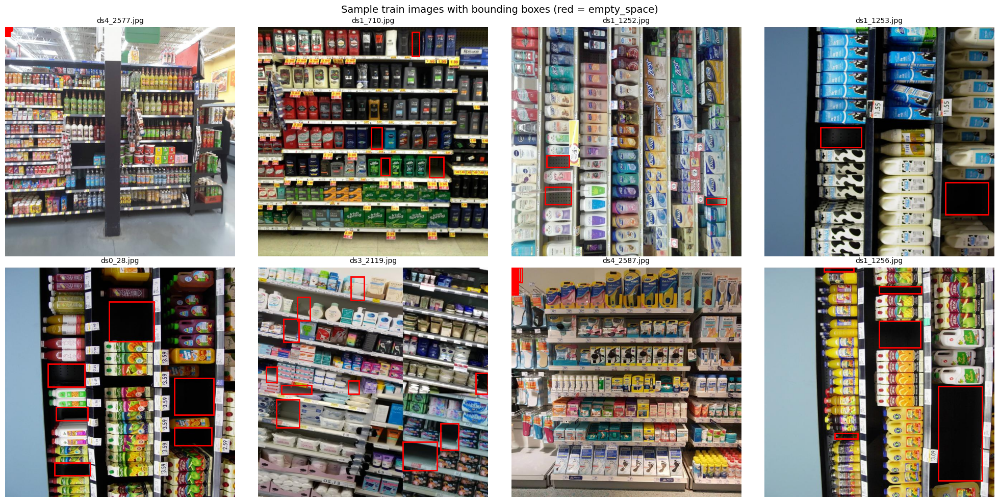

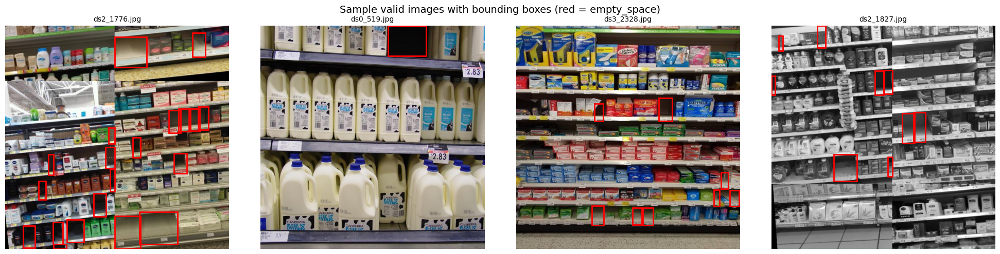

In [6]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import random

def show_samples(split="train", n=8):
    img_dir = f"/kaggle/working/combined_dataset/{split}/images"
    lbl_dir = f"/kaggle/working/combined_dataset/{split}/labels"
    
    images = glob.glob(f"{img_dir}/*.*")
    samples = random.sample(images, min(n, len(images)))
    
    cols = 4
    rows = (n + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
    axes = axes.flatten()
    
    for i, img_path in enumerate(samples):
        img = Image.open(img_path)
        axes[i].imshow(img)
        
        base = os.path.splitext(os.path.basename(img_path))[0]
        lbl_path = os.path.join(lbl_dir, base + ".txt")
        
        if os.path.exists(lbl_path):
            w, h = img.size
            with open(lbl_path) as f:
                for line in f.readlines():
                    parts = line.strip().split()
                    if len(parts) >= 5:
                        cx, cy, bw, bh = float(parts[1]), float(parts[2]), float(parts[3]), float(parts[4])
                        x1 = (cx - bw/2) * w
                        y1 = (cy - bh/2) * h
                        rect = patches.Rectangle(
                            (x1, y1), bw * w, bh * h,
                            linewidth=2, edgecolor='red', facecolor='none'
                        )
                        axes[i].add_patch(rect)
        
        axes[i].set_title(os.path.basename(img_path)[:15], fontsize=10)
        axes[i].axis('off')
    
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')
    
    plt.suptitle(f"Sample {split} images with bounding boxes (red = empty_space)", fontsize=14)
    plt.tight_layout()
    plt.show()

show_samples("train", 8)
show_samples("valid", 4)

In [7]:
model = YOLO('yolov8m.pt')  # medium to be safe on free GPU
model.train(
    data='/kaggle/working/combined_dataset/data.yaml',  # absolute path
    epochs=40,
    imgsz=640,
    batch=16,
    freeze=10,
    augment=True,
    mosaic=1.0,
    mixup=0.2,
    name='v3_phase1',
    project='/kaggle/working/runs'  # save runs here
)

# Phase 2
model2 = YOLO('/kaggle/working/runs/v3_phase1/weights/best.pt')
model2.train(
    data='/kaggle/working/combined_dataset/data.yaml',
    epochs=30,
    imgsz=640,
    batch=16,
    freeze=0,
    lr0=0.001,
    augment=False,
    mosaic=0.0,
    name='v3_phase2',
    project='/kaggle/working/runs'
)

Ultralytics 8.4.18 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/combined_dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=40, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=10, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.2, mode=train, model=yolov8m.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=v3_phase1, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f96b2bf1580>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 


image 1/1 /kaggle/working/combined_dataset/valid/images/ds0_507.jpg: 640x640 4 empty_spaces, 36.9ms
Speed: 1.6ms preprocess, 36.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/combined_dataset/valid/images/ds1_1339.jpg: 640x640 5 empty_spaces, 35.6ms
Speed: 1.7ms preprocess, 35.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/combined_dataset/valid/images/ds2_1852.jpg: 640x640 6 empty_spaces, 35.3ms
Speed: 1.4ms preprocess, 35.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/combined_dataset/valid/images/ds3_2299.jpg: 640x640 8 empty_spaces, 35.3ms
Speed: 1.4ms preprocess, 35.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/combined_dataset/valid/images/ds2_1843.jpg: 640x640 5 empty_spaces, 27.6ms
Speed: 2.6ms preprocess, 27.6ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

image

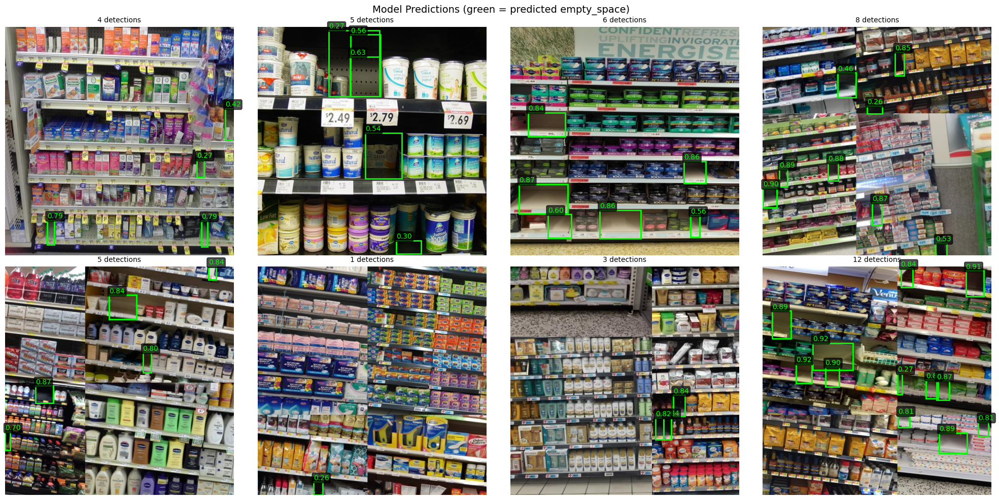

Ultralytics 8.4.18 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 14913MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2349.5±554.4 MB/s, size: 96.3 KB)
val: Scanning /kaggle/working/combined_dataset/valid/labels.cache... 332 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 332/332 116.0Mit/s 0.0s
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 4, len(boxes) = 1735. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 21/21 1.9it/s 11.1s0.5s
                   all        332       1735      0.901      0.807      0.884      0.647
Speed: 1.6ms preprocess, 27.7ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to /kaggle/working/runs/detect/val

mAP50: 0.8837
mAP50-95: 0.6465
Precision: 0.9009
Recall: 0.8

In [11]:
from ultralytics import YOLO
from PIL import Image
import matplotlib.pyplot as plt
import random
import glob

best_model = YOLO('/kaggle/working/runs/v3_phase2/weights/best.pt')

# Get random test/valid images
test_images = glob.glob("/kaggle/working/combined_dataset/valid/images/*.*")
samples = random.sample(test_images, min(8, len(test_images)))

fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()

for i, img_path in enumerate(samples):
    results = best_model(img_path, conf=0.25)[0]
    
    img = Image.open(img_path)
    axes[i].imshow(img)
    
    for box in results.boxes:
        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
        conf = box.conf[0].cpu().numpy()
        rect = plt.Rectangle(
            (x1, y1), x2 - x1, y2 - y1,
            linewidth=2, edgecolor='lime', facecolor='none'
        )
        axes[i].add_patch(rect)
        axes[i].text(x1, y1 - 5, f'{conf:.2f}', color='lime', fontsize=10,
                     bbox=dict(boxstyle='round,pad=0.2', facecolor='black', alpha=0.7))
    
    axes[i].set_title(f"{len(results.boxes)} detections", fontsize=10)
    axes[i].axis('off')

plt.suptitle("Model Predictions (green = predicted empty_space)", fontsize=14)
plt.tight_layout()
plt.show()

# Also run official metrics
metrics = best_model.val(data='/kaggle/working/combined_dataset/data.yaml')
print(f"\nmAP50: {metrics.box.map50:.4f}")
print(f"mAP50-95: {metrics.box.map:.4f}")
print(f"Precision: {metrics.box.mp:.4f}")
print(f"Recall: {metrics.box.mr:.4f}")

In [18]:
from IPython.display import display, HTML

# Make sure the file exists first
import shutil
shutil.copy('/kaggle/working/runs/v3_phase2/weights/best.pt', '/kaggle/working/best.pt')

# Check it's there
print(os.path.exists('/kaggle/working/best.pt'))
print(f"Size: {os.path.getsize('/kaggle/working/best.pt') / 1e6:.1f} MB")

True
Size: 52.0 MB


In [19]:
import hashlib

def file_hash(path):
    return hashlib.md5(open(path, 'rb').read()).hexdigest()

print(file_hash('/kaggle/working/best.pt'))
print(file_hash('/kaggle/working/runs/v3_phase2/weights/best.pt'))
# These should match

9a310643f77df48a5beabbb3206dc375
9a310643f77df48a5beabbb3206dc375
